## ML algorithms Used
* Linear Regression
* Lasso Regression
* Decision Tree Regressor

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df=pd.read_csv("Data/Real-Data/Real_Combine.csv")

In [3]:
df.head()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4,219.720833
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1,182.187500
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1,154.037500
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6,223.208333
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2,200.645833


<AxesSubplot:>

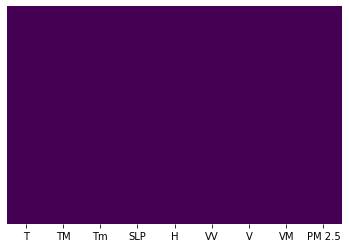

In [4]:
### check for null values
sns.heatmap(df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

In [5]:
df=df.dropna()

In [6]:
X=df.iloc[:,:-1] ## independent features
y= df.iloc[:,-1] # dependent feature 

In [7]:
## Check null values
X.isnull()

,T,TM,Tm,SLP,H,VV,V,VM
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
726,False,False,False,False,False,False,False,False
727,False,False,False,False,False,False,False,False
728,False,False,False,False,False,False,False,False
729,False,False,False,False,False,False,False,False


In [8]:
y.isnull()

0      False
1      False
2      False
3      False
4      False
       ...  
726    False
727    False
728    False
729    False
730    False
Name: PM 2.5, Length: 730, dtype: bool

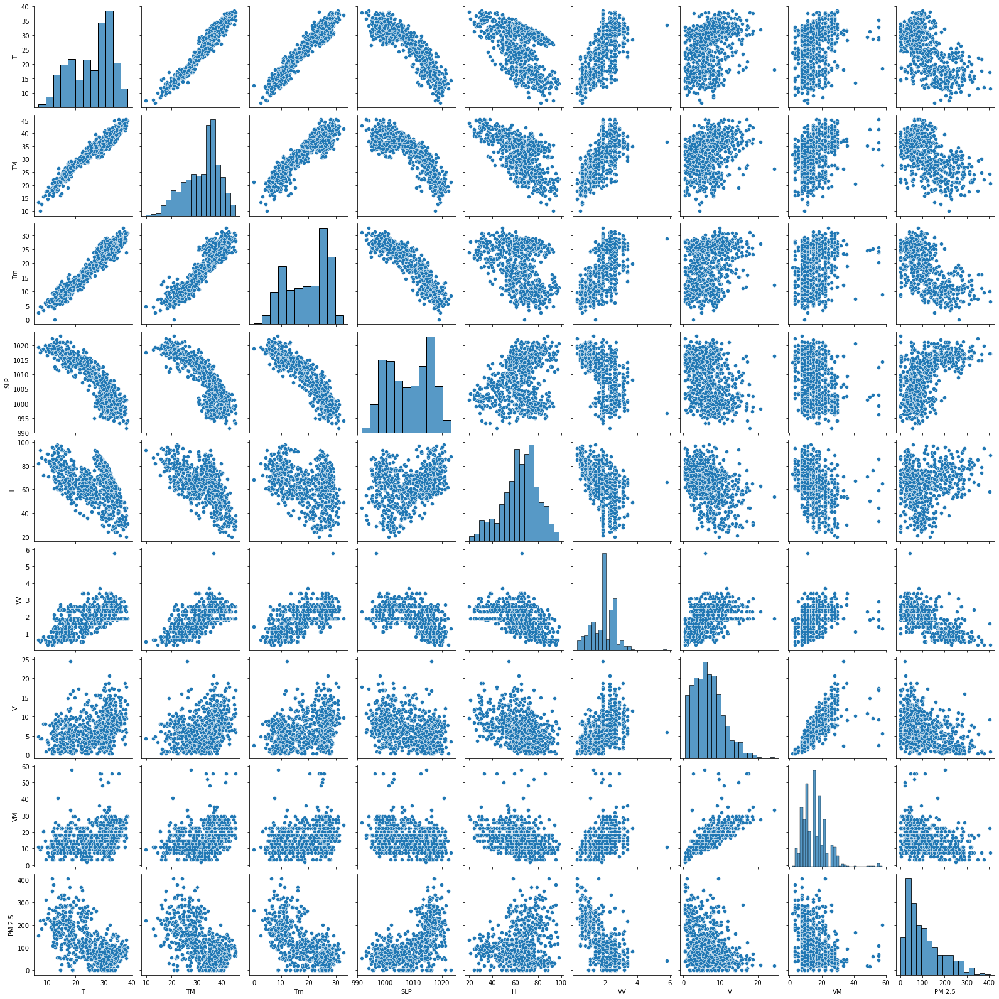

In [9]:
sns.pairplot(df)

In [10]:
df.corr()

,T,TM,Tm,SLP,H,VV,V,VM,PM 2.5
T,1.000000,0.967276,0.958892,-0.884383,-0.518870,0.622637,0.326067,0.287138,-0.628336
TM,0.967276,1.000000,0.896699,-0.829254,-0.599629,0.598479,0.320116,0.299508,-0.569381
Tm,0.958892,0.896699,1.000000,-0.909514,-0.315305,0.560299,0.312904,0.259431,-0.669059
SLP,-0.884383,-0.829254,-0.909514,1.000000,0.274196,-0.491842,-0.346130,-0.299830,0.615615
H,-0.518870,-0.599629,-0.315305,0.274196,1.000000,-0.475279,-0.399079,-0.370981,0.174658
VV,0.622637,0.598479,0.560299,-0.491842,-0.475279,1.000000,0.402884,0.347493,-0.628621
V,0.326067,0.320116,0.312904,-0.346130,-0.399079,0.402884,1.000000,0.760777,-0.354799
VM,0.287138,0.299508,0.259431,-0.299830,-0.370981,0.347493,0.760777,1.000000,-0.283695
PM 2.5,-0.628336,-0.569381,-0.669059,0.615615,0.174658,-0.628621,-0.354799,-0.283695,1.000000


### Correlation Matrix with Heatmap
Correlation states how the features are related to each other or the target variable.

Correlation can be positive (increase in one value of feature increases the value of the target variable) or negative (increase in one value of feature decreases the value of the target variable)

Heatmap makes it easy to identify which features are most related to the target variable, we will plot heatmap of correlated features using the seaborn library.

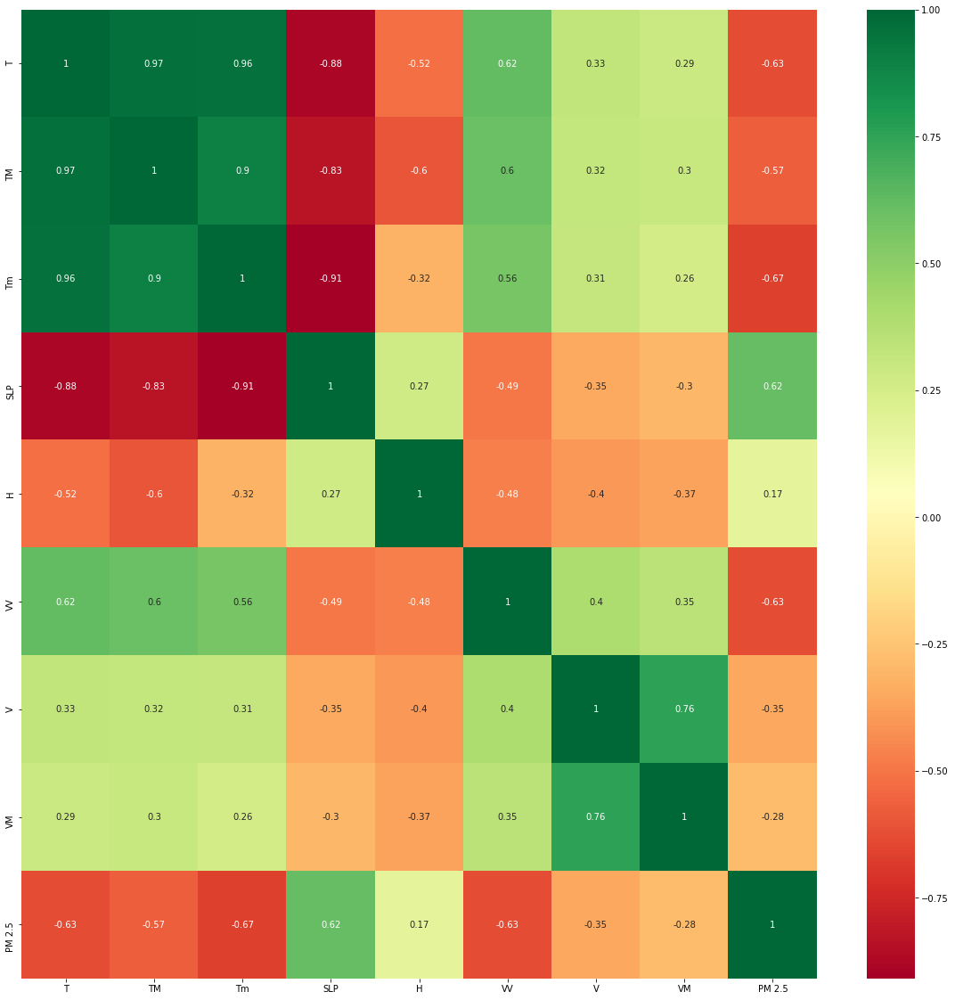

In [11]:
import seaborn as sns
#get correlations of each features in dataset
corrmat = df.corr()
top_corr_features = corrmat.index
plt.figure(figsize=(20,20))
#plot heat map
g=sns.heatmap(df[top_corr_features].corr(),annot=True,cmap="RdYlGn")

In [12]:
corrmat.index

Index(['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM', 'PM 2.5'], dtype='object')

### Feature Importance
You can get the feature importance of each feature of your dataset by using the feature importance property of the model.

Feature importance gives you a score for each feature of your data, the higher the score more important or relevant is the feature towards your output variable.

Feature importance is an inbuilt class that comes with Tree Based Regressor, we will be using Extra Tree Regressor for extracting the top 10 features for the dataset.

In [13]:
from sklearn.ensemble import ExtraTreesRegressor
import matplotlib.pyplot as plt
model=ExtraTreesRegressor()
model.fit(X,y)


ExtraTreesRegressor()

In [14]:
X.head()

,T,TM,Tm,SLP,H,VV,V,VM
0,7.4,9.8,4.8,1017.6,93.0,0.5,4.3,9.4
1,7.8,12.7,4.4,1018.5,87.0,0.6,4.4,11.1
2,6.7,13.4,2.4,1019.4,82.0,0.6,4.8,11.1
3,8.6,15.5,3.3,1018.7,72.0,0.8,8.1,20.6
4,12.4,20.9,4.4,1017.3,61.0,1.3,8.7,22.2


In [15]:
print(model.feature_importances_)

[0.14398631 0.08647348 0.20269803 0.12778807 0.0813413  0.26547224
 0.05320981 0.03903077]


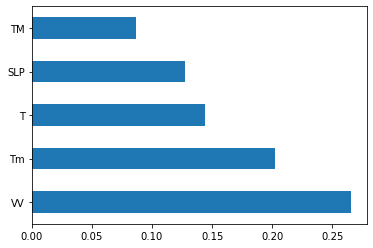

In [16]:
#plot graph of feature importances for better visualization
feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(5).plot(kind='barh')
plt.show()

## Decision Tree Regressor

C:\Users\Ranjith\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

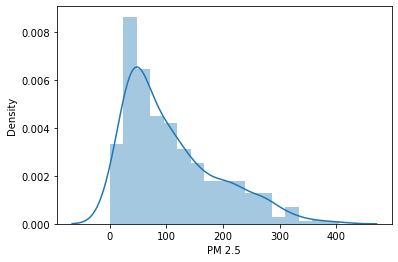

In [17]:
sns.distplot(y)

## Train Test Split

In [18]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.3,random_state=0)

In [19]:
from sklearn.tree import DecisionTreeRegressor

In [20]:
dtree=DecisionTreeRegressor(criterion="mse")

In [21]:
dtree.fit(X_train,y_train)

DecisionTreeRegressor()

In [22]:
print("Coefficient of determination R^2 <-- on train set: {}".format(dtree.score(X_train, y_train)))

Coefficient of determination R^2 <-- on train set: 1.0


In [23]:
print("Coefficient of determination R^2 <-- on test set: {}".format(dtree.score(X_test, y_test)))

Coefficient of determination R^2 <-- on test set: 0.3567102899299692


In [24]:
from sklearn.model_selection import cross_val_score
score=cross_val_score(dtree,X,y,cv=5)

In [25]:
score.mean()

0.1291272468930625

### Tree Visualization
Scikit learn actually has some built-in visualization capabilities for decision trees, you won't use this often and it requires you to install the pydot library, but here is an example of what it looks like and the code to execute this:

In [26]:
pip install --upgrade scikit-learn==0.20.3

  Using cached scikit-learn-0.20.3.tar.gz (11.8 MB)
  Running setup.py clean for scikit-learn
Failed to build scikit-learn
  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.23.2
    Uninstalling scikit-learn-0.23.2:
      Successfully uninstalled scikit-learn-0.23.2
    Running setup.py install for scikit-learn: started
    Running setup.py install for scikit-learn: finished with status 'error'
  Rolling back uninstall of scikit-learn
  Moving to c:\users\ranjith\anaconda3\lib\site-packages\scikit_learn-0.23.2.dist-info\
   from C:\Users\Ranjith\anaconda3\Lib\site-packages\~cikit_learn-0.23.2.dist-info
  Moving to c:\users\ranjith\anaconda3\lib\site-packages\sklearn\
   from C:\Users\Ranjith\anaconda3\Lib\site-packages\~klearn
Note: you may need to restart the kernel to use updated packages.


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\Ranjith\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\Ranjith\\AppData\\Local\\Temp\\pip-install-2iqi7fza\\scikit-learn_a6de1f9a81dd475a9fceb44fecd5013f\\setup.py'"'"'; __file__='"'"'C:\\Users\\Ranjith\\AppData\\Local\\Temp\\pip-install-2iqi7fza\\scikit-learn_a6de1f9a81dd475a9fceb44fecd5013f\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\Ranjith\AppData\Local\Temp\pip-wheel-nbzmo4hg'
       cwd: C:\Users\Ranjith\AppData\Local\Temp\pip-install-2iqi7fza\scikit-learn_a6de1f9a81dd475a9fceb44fecd5013f\
  Complete output (675 lines):
  Partial import of sklearn during the build process.
  blas_opt_info:
  blas_mkl_info:


In [27]:
from six import StringIO


  copying sklearn\gaussian_process\gpc.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process
  copying sklearn\gaussian_process\gpr.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process
  copying sklearn\gaussian_process\kernels.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process
  copying sklearn\gaussian_process\regression_models.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process
  copying sklearn\gaussian_process\__init__.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process
  creating build\lib.win-amd64-3.8\sklearn\gaussian_process\tests
  copying sklearn\gaussian_process\tests\test_gpc.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process/tests
  copying sklearn\gaussian_process\tests\test_gpr.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process/tests
  copying sklearn\gaussian_process\tests\test_kernels.py -> build\lib.win-amd64-3.8\sklearn\gaussian_process/tests
  copying sklearn\gaussian_process\tests\__init__.py -> build\lib.win-amd64-3.8\sklearn\gaussian_proces

In [28]:
pip install --upgrade mglearn


  copying sklearn\manifold\mds.py -> build\lib.win-amd64-3.8\sklearn\manifold
  copying sklearn\manifold\setup.py -> build\lib.win-amd64-3.8\sklearn\manifold
  copying sklearn\manifold\spectral_embedding_.py -> build\lib.win-amd64-3.8\sklearn\manifold
  copying sklearn\manifold\t_sne.py -> build\lib.win-amd64-3.8\sklearn\manifold
  copying sklearn\manifold\__init__.py -> build\lib.win-amd64-3.8\sklearn\manifold
  creating build\lib.win-amd64-3.8\sklearn\manifold\tests
  copying sklearn\manifold\tests\test_isomap.py -> build\lib.win-amd64-3.8\sklearn\manifold\tests
  copying sklearn\manifold\tests\test_locally_linear.py -> build\lib.win-amd64-3.8\sklearn\manifold\tests
  copying sklearn\manifold\tests\test_mds.py -> build\lib.win-amd64-3.8\sklearn\manifold\tests
  copying sklearn\manifold\tests\test_spectral_embedding.py -> build\lib.win-amd64-3.8\sklearn\manifold\tests
  copying sklearn\manifold\tests\test_t_sne.py -> build\lib.win-amd64-3.8\sklearn\manifold\tests
  copying sklearn\ma

Note: you may need to restart the kernel to use updated packages.


In [ ]:
import six
import sys
sys.modules['sklearn.externals.six'] = six

In [32]:
##conda install pydotplus
## conda install python-graphviz

from IPython.display import Image  
from sklearn.externals.six import StringIO  
from sklearn.tree import export_graphviz
import pydotplus

In [34]:
features = list(df.columns[:-1])
features

['T', 'TM', 'Tm', 'SLP', 'H', 'VV', 'V', 'VM']

In [35]:
import os

os.environ['PATH'] = os.environ['PATH']+';'+os.environ['CONDA_PREFIX']+r"\Library\bin\graphviz"

In [36]:
dot_data = StringIO()  
export_graphviz(dtree, out_file=dot_data,feature_names=features,filled=True,rounded=True)

graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

### Model Evaluation¶

In [37]:
prediction=dtree.predict(X_test)

C:\Users\Ranjith\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

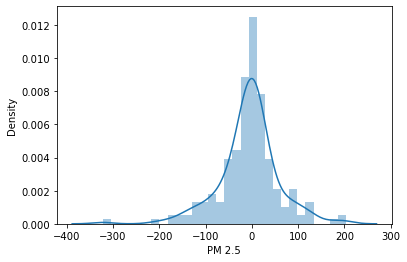

In [38]:
sns.distplot(y_test-prediction)

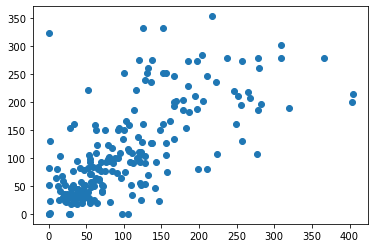

In [39]:
plt.scatter(y_test,prediction)

### Hyperparameter Tuning DEcision Tree Regressor

In [40]:
DecisionTreeRegressor()

DecisionTreeRegressor()

In [41]:
## Hyper Parameter Optimization

params={
 "splitter"    : ["best","random"] ,
 "max_depth"        : [ 3, 4, 5, 6, 8, 10, 12, 15],
 "min_samples_leaf" : [ 1,2,3,4,5 ],
"min_weight_fraction_leaf":[0.1,0.2,0.3,0.4],
 "max_features" : ["auto","log2","sqrt",None ],
    "max_leaf_nodes":[None,10,20,30,40,50,60,70]
    
}

In [42]:
## Hyperparameter optimization using GridSearchCV
from sklearn.model_selection import GridSearchCV

In [43]:
random_search=GridSearchCV(dtree,param_grid=params,scoring='neg_mean_squared_error',n_jobs=-1,cv=10,verbose=3)

In [44]:
def timer(start_time=None):
    if not start_time:
        start_time = datetime.now()
        return start_time
    elif start_time:
        thour, temp_sec = divmod((datetime.now() - start_time).total_seconds(), 3600)
        tmin, tsec = divmod(temp_sec, 60)
        print('\n Time taken: %i hours %i minutes and %s seconds.' % (thour, tmin, round(tsec, 2)))

In [45]:
from datetime import datetime
# Here we go
start_time = timer(None) # timing starts from this point for "start_time" variable
random_search.fit(X,y)
timer(start_time) # timing ends here for "start_time" variable

Fitting 10 folds for each of 10240 candidates, totalling 102400 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 tasks      | elapsed:    3.6s
[Parallel(n_jobs=-1)]: Done 408 tasks      | elapsed:    4.4s
[Parallel(n_jobs=-1)]: Done 2968 tasks      | elapsed:    8.8s
[Parallel(n_jobs=-1)]: Done 6552 tasks      | elapsed:   15.6s
[Parallel(n_jobs=-1)]: Done 11160 tasks      | elapsed:   22.5s
[Parallel(n_jobs=-1)]: Done 16792 tasks      | elapsed:   30.0s
[Parallel(n_jobs=-1)]: Done 23448 tasks      | elapsed:   38.0s
[Parallel(n_jobs=-1)]: Done 31128 tasks      | elapsed:   47.1s
[Parallel(n_jobs=-1)]: Done 39832 tasks      | elapsed:   57.2s
[Parallel(n_jobs=-1)]: Done 49560 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 60312 tasks      | elapsed:  1.4min
[Parallel(n_jobs=-1)]: Done 72088 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 84888 tasks      | elapsed:  1.9min
[Parallel(n_jobs=-1)]: Done 98712 tasks      | elapsed:  2.3min
[Parallel(n_jobs=-1)]: Done 102400


 Time taken: 0 hours 2 minutes and 23.08 seconds.


In [46]:
random_search.best_params_

{'max_depth': 3,
 'max_features': 'log2',
 'max_leaf_nodes': 60,
 'min_samples_leaf': 5,
 'min_weight_fraction_leaf': 0.1,
 'splitter': 'best'}

In [47]:
random_search.best_score_

-3112.2962637059736

In [48]:
predictions=random_search.predict(X_test)

C:\Users\Ranjith\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='PM 2.5', ylabel='Density'>

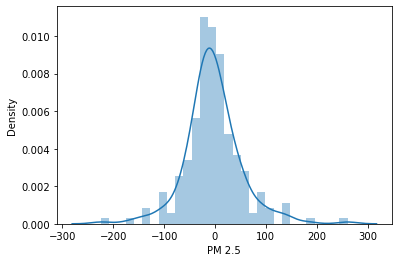

In [49]:
sns.distplot(y_test-predictions)

In [52]:
import sklearn.metrics as metrics

In [54]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))
MAE: 40.14163092473

MAE: 39.126290270205
MSE: 3116.132933787384
RMSE: 55.822333646913975


### Regression Evaluation Metrics
Here are three common evaluation metrics for regression problems:

Mean Absolute Error (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
Mean Squared Error (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$
Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$
Comparing these metrics:

MAE is the easiest to understand, because it's the average error.
MSE is more popular than MAE, because MSE "punishes" larger errors, which tends to be useful in the real world.
RMSE is even more popular than MSE, because RMSE is interpretable in the "y" units.
All of these are loss functions, because we want to minimize them.

In [55]:
from sklearn import metrics

In [56]:
print('MAE:', metrics.mean_absolute_error(y_test, prediction))
print('MSE:', metrics.mean_squared_error(y_test, prediction))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, prediction)))

MAE: 43.53944063926941
MSE: 4199.494190211187
RMSE: 64.80350445933604


In [57]:
import pickle

In [58]:
# open a file, where you ant to store the data
file = open('decision_regression_model.pkl', 'wb')

# dump information to that file
pickle.dump(random_search, file)